# **Imports**

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft, fftfreq, ifft
from IPython.display import Audio
from scipy.signal import medfilt
from scipy.signal.windows import gaussian

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load the audio file
file_path = "/content/drive/MyDrive/Master's degree/DSP/harpsi-cs.wav"

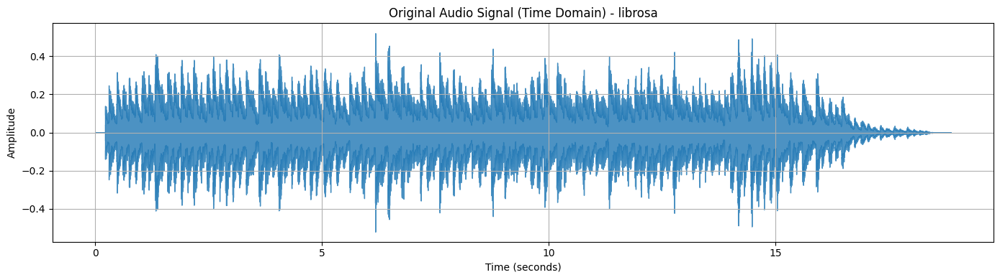

In [ ]:
# Load the audio using librosa
signal, sample_rate = librosa.load(file_path, sr=None)  # To keep original sampling rate

# Visualize the audio in the time domain using librosa's waveshow
plt.figure(figsize=(14, 4))
librosa.display.waveshow(signal, sr=sample_rate, alpha=0.8) # 20% transparency
plt.title("Original Audio Signal (Time Domain) - librosa")
plt.xlabel("Time (seconds)")
plt.ylabel("Amplitude")
plt.grid()
plt.tight_layout()
plt.show()

## Part 1: Periodic Noise

1. **Add Periodic Noise**:
   - Introduce three periodic noise components (50 Hz, 120 Hz, and 200 Hz) to the provided audio file `harpsi-cs.wav`.
   - Visualize the noisy signals in the time domain.
   
   **Hints**:
   - Use `np.sin` to generate periodic noise at specific frequencies.
   - Ensure the amplitude of the noise is small relative to the original signal to simulate real-world scenarios.
   - Use `matplotlib` to plot the noisy signals.

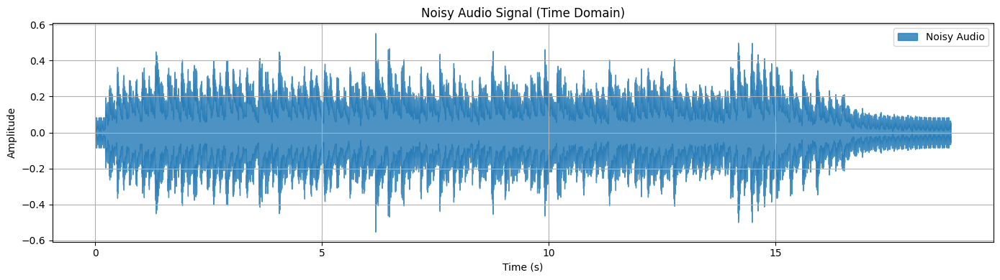

In [ ]:
time = np.arange(0, len(signal)) / sample_rate

# Generate periodic noise components
noise_50Hz = 0.03 * np.sin(2 * np.pi * 50 * time)   # Amplitude = 0.03 for realism
noise_120Hz = 0.03 * np.sin(2 * np.pi * 120 * time)
noise_200Hz = 0.03 * np.sin(2 * np.pi * 200 * time)

# Combine the noise components
total_noise = noise_50Hz + noise_120Hz + noise_200Hz

# Add the combined noise to the original audio
noisy_audio = signal + total_noise

# Visualize the noisy signal in the time domain using librosa
plt.figure(figsize=(14, 4))
librosa.display.waveshow(noisy_audio, sr=sample_rate, alpha=0.8, label="Noisy Audio")
plt.title("Noisy Audio Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

2. **Analyze the Noisy Signals**:
   - Perform the DFT of the noisy signals to analyze their frequency content.
   - Identify and mark the dominant noise frequencies in the spectrum.

   **Hints**:
   - Use `scipy.fft.fft` to compute the DFT and `scipy.fft.fftfreq` to get the frequency bins.
   - Plot the magnitude spectrum using `plt.plot` and focus on the positive frequencies.

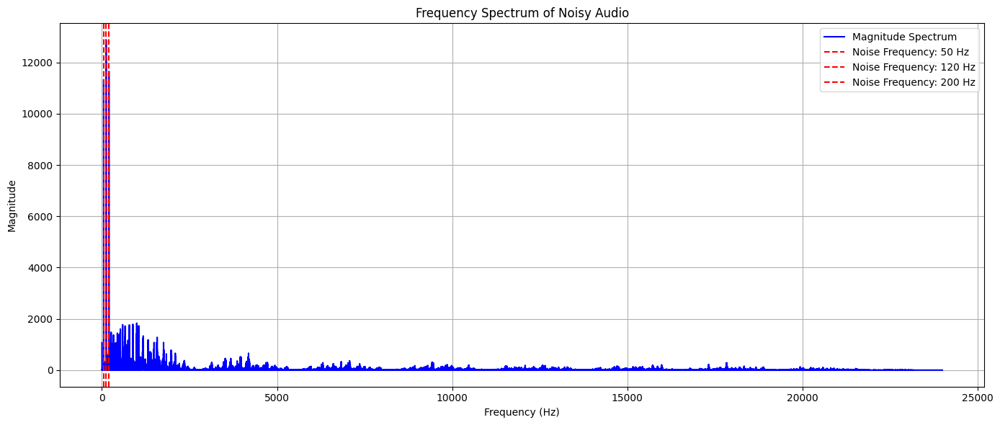

In [ ]:
# Compute the DFT of the noisy audio
dft = fft(noisy_audio)
freq = fftfreq(len(noisy_audio), 1 / sample_rate)

# Compute the magnitude spectrum
magnitude = np.abs(dft)

# Focus on positive frequencies
positive_freqs = freq[:len(freq) // 2]
positive_magnitude = magnitude[:len(freq) // 2]

# Plot the magnitude spectrum
plt.figure(figsize=(14, 6))
plt.plot(positive_freqs, positive_magnitude, label="Magnitude Spectrum", color="blue")
plt.title("Frequency Spectrum of Noisy Audio")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
# Focus on the noisy range
for i in [50,120,200]:
    plt.axvline(i, color='red', linestyle='--', label=f"Noise Frequency: {i} Hz")
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

3. **Filter the Noise in the Frequency Domain**:
   - Design and apply ideal band-stop filters to remove the noise frequencies.
   - Perform the inverse DFT to reconstruct the filtered signals.

   **Hints**:
   - Create a filter mask using logical conditions on the frequency array.
   - Multiply the filter mask with the DFT of the noisy signal.
   - Use `np.fft.ifft` to convert the filtered signal back to the time domain.

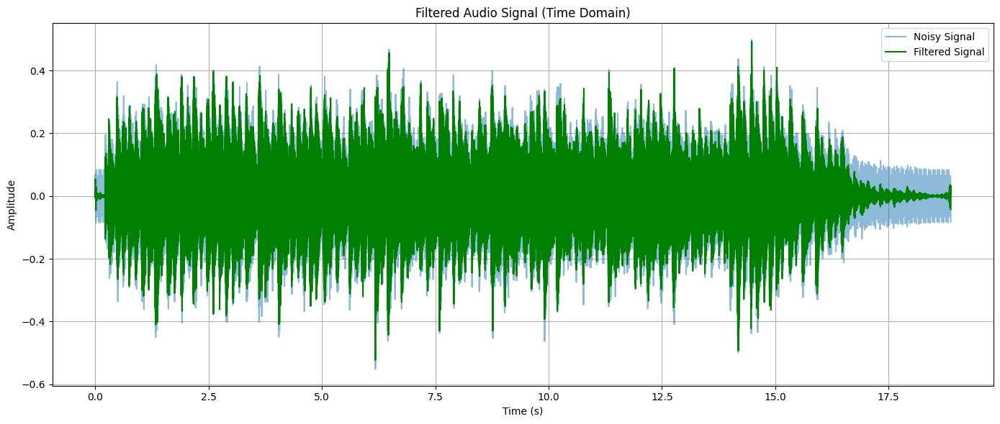

In [ ]:
# Design an ideal band-stop filter
def band_stop_filter(freq, center, width=5):
    """Creates a band-stop filter for a given center frequency and width."""
    mask = np.ones_like(freq)
    mask[np.abs(freq - center) < width] = 0
    mask[np.abs(freq + center) < width] = 0  # Mirror for negative frequencies
    return mask

# Create the filter mask
filter_mask = band_stop_filter(freq, 50) * band_stop_filter(freq, 120) * band_stop_filter(freq, 200)

# Apply the filter to the DFT of the noisy signal
filtered_dft = dft * filter_mask

# Perform the inverse DFT to reconstruct the filtered signal
filtered_signal = np.real(ifft(filtered_dft))

# Plot the filtered signal in the time domain
plt.figure(figsize=(14, 6))
plt.plot(time, noisy_audio, label="Noisy Signal", alpha=0.5)
plt.plot(time, filtered_signal, label="Filtered Signal", color="green")
plt.title("Filtered Audio Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

4. **Compare Results**:
   - Plot the original, noisy, and filtered signals in both time and frequency domains.
   - Listen to the original, noisy, and filtered audio signals to evaluate the effectiveness of the filters.

   **Hints**:
   - Use `matplotlib` for visualization and `IPython.display.Audio` for playback.

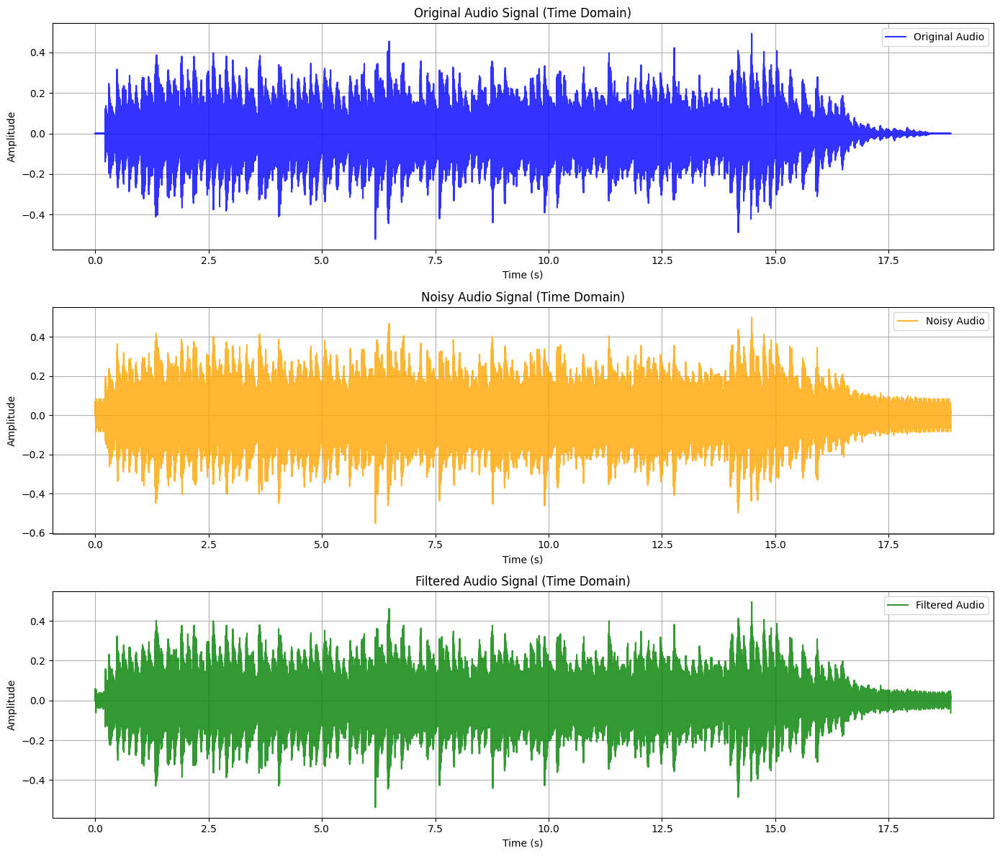

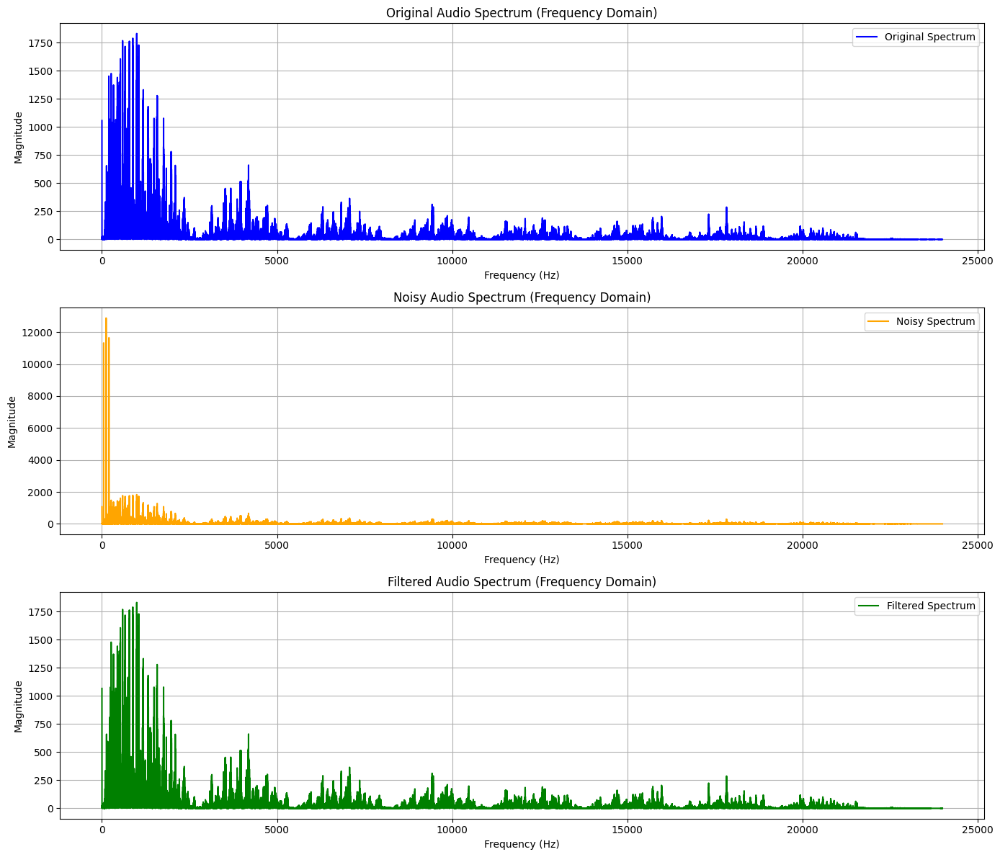

In [ ]:
# Define time array
time = np.arange(0, len(signal)) / sample_rate

# Add periodic noise
noise_50Hz = 0.03 * np.sin(2 * np.pi * 50 * time)
noise_120Hz = 0.03 * np.sin(2 * np.pi * 120 * time)
noise_200Hz = 0.03 * np.sin(2 * np.pi * 200 * time)
noisy_audio = signal + noise_50Hz + noise_120Hz + noise_200Hz

# Compute DFTs
freq = fftfreq(len(signal), 1 / sample_rate)
original_dft = fft(signal)
noisy_dft = fft(noisy_audio)

# Create a filter mask and apply to noisy DFT
filter_mask = (np.abs(freq - 50) >= 5) & (np.abs(freq - 120) >= 5) & (np.abs(freq - 200) >= 5)
filtered_dft = noisy_dft * filter_mask
filtered_audio = np.real(ifft(filtered_dft))

# Compute magnitudes for visualization
positive_freqs = freq[:len(freq) // 2]
original_magnitude = np.abs(original_dft[:len(freq) // 2])
noisy_magnitude = np.abs(noisy_dft[:len(freq) // 2])
filtered_magnitude = np.abs(filtered_dft[:len(freq) // 2])

# Visualization: Time Domain Comparison
plt.figure(figsize=(14, 12))

# Original Signal
plt.subplot(3, 1, 1)
plt.plot(time, signal, label="Original Audio", color="blue", alpha=0.8)
plt.title("Original Audio Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Noisy Signal
plt.subplot(3, 1, 2)
plt.plot(time, noisy_audio, label="Noisy Audio", color="orange", alpha=0.8)
plt.title("Noisy Audio Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Filtered Signal
plt.subplot(3, 1, 3)
plt.plot(time, filtered_audio, label="Filtered Audio", color="green", alpha=0.8)
plt.title("Filtered Audio Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

# Visualization: Frequency Domain Comparison
plt.figure(figsize=(14, 12))

# Original Spectrum
plt.subplot(3, 1, 1)
plt.plot(positive_freqs, original_magnitude, label="Original Spectrum", color="blue")
plt.title("Original Audio Spectrum (Frequency Domain)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.legend()
plt.grid()

# Noisy Spectrum
plt.subplot(3, 1, 2)
plt.plot(positive_freqs, noisy_magnitude, label="Noisy Spectrum", color="orange")
plt.title("Noisy Audio Spectrum (Frequency Domain)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.legend()
plt.grid()

# Filtered Spectrum
plt.subplot(3, 1, 3)
plt.plot(positive_freqs, filtered_magnitude, label="Filtered Spectrum", color="green")
plt.title("Filtered Audio Spectrum (Frequency Domain)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
# Playback for evaluation
print("Original Audio:")
Audio(signal, rate=sample_rate)

Original Audio:


In [ ]:
print("Noisy Audio:")
Audio(noisy_audio, rate=sample_rate)

Noisy Audio:


In [ ]:
print("Filtered Audio:")
Audio(filtered_audio, rate=sample_rate)

Filtered Audio:


**Original Audio Signal:**

This signal represents the clean audio in the time domain.
The waveform shows consistent periodicity, indicating that it’s a steady signal without noise.The dominant frequencies are concentrated in the lower frequency range.

**Noisy Audio Signal:**

Noise has been added to the original signal, which is evident from the irregular fluctuations in the waveform.
The signal is less periodic and has a more chaotic appearance due to the superimposed noise components. The presence of the noisy peaks significantly alters the spectrum compared to the original.

**Filtered Audio Signal:**

After applying a filter to remove noise, the signal looks cleaner.
It closely resembles the original audio, demonstrating the effectiveness of the filtering process.

## Part 2: Impulsive and Gaussian Noise

1. **Add Impulsive and Gaussian Noise**:
   - Introduce "salt-and-pepper" noise (random spikes) to the audio signal.
   - Add Gaussian noise with a specified standard deviation to the audio signal.
   - Visualize the noisy signals in the time domain.

   **Hints**:
   - Use `np.random.choice` to generate impulsive noise at random positions.
   - Use `np.random.normal` to generate Gaussian noise.
   - Plot the noisy signals using `matplotlib`.

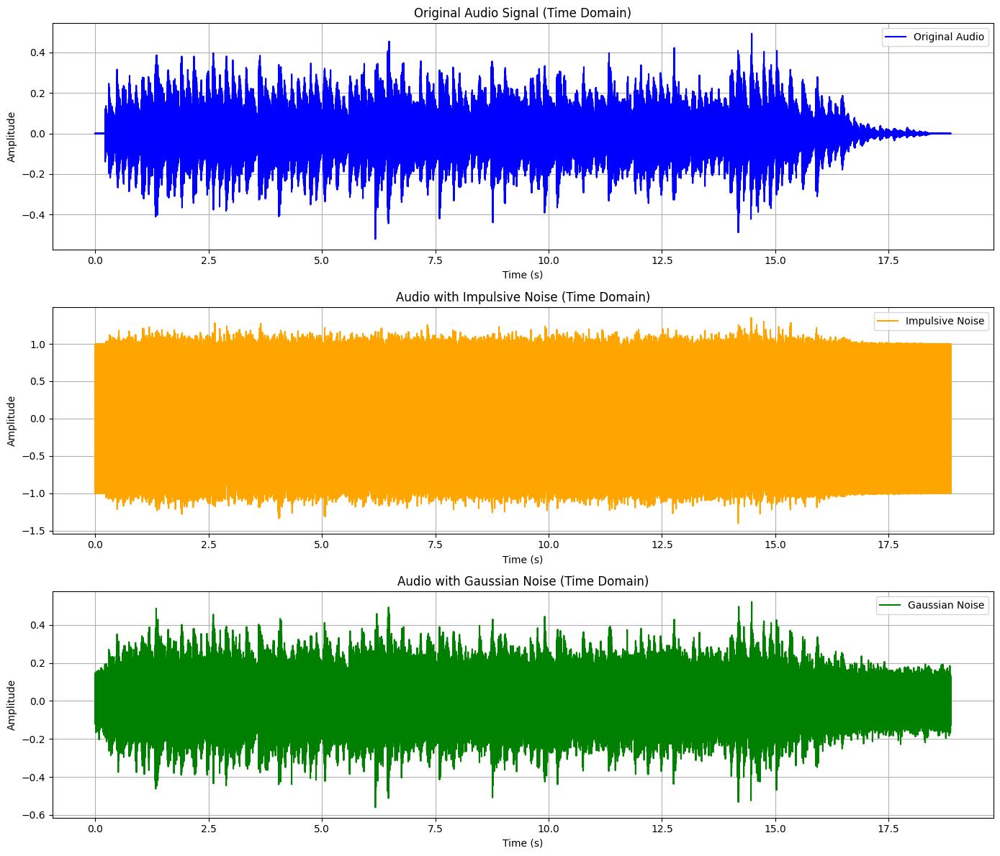

In [ ]:
# Add Impulsive Noise (Salt-and-Pepper Noise)
impulsive_noisy_audio = signal.copy()
num_impulses = int(0.01 * len(signal))  # 1% of the total samples
impulse_indices = np.random.choice(len(signal), num_impulses, replace=False)  # Randomly select indices
impulsive_noisy_audio[impulse_indices] += np.random.choice([-1, 1], size=num_impulses)  # Adding noise spikes with max or min amplitude to the signal

# Add Gaussian Noise
std_dev = 0.05  # Standard deviation of Gaussian noise
gaussian_noise = np.random.normal(0, std_dev, len(signal))
gaussian_noisy_audio = signal + gaussian_noise

# Plot original, impulsive noisy, and Gaussian noisy signals in the time domain
plt.figure(figsize=(14, 12))

# Original signal
plt.subplot(3, 1, 1)
plt.plot(time, signal, label="Original Audio", color="blue")
plt.title("Original Audio Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Impulsive noisy signal
plt.subplot(3, 1, 2)
plt.plot(time, impulsive_noisy_audio, label="Impulsive Noise", color="orange")
plt.title("Audio with Impulsive Noise (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Gaussian noisy signal
plt.subplot(3, 1, 3)
plt.plot(time, gaussian_noisy_audio, label="Gaussian Noise", color="green")
plt.title("Audio with Gaussian Noise (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

2. **Analyze the Noisy Signals**:
   - Examine the characteristics of the noisy signals in the time domain.
   - Discuss the suitability of different time-domain filters for each noise type.

   **Hints**:
   - Compare the amplitude and frequency characteristics of impulsive and Gaussian noise.
   - Note that impulsive noise consists of high-amplitude spikes, while Gaussian noise is spread across the signal.

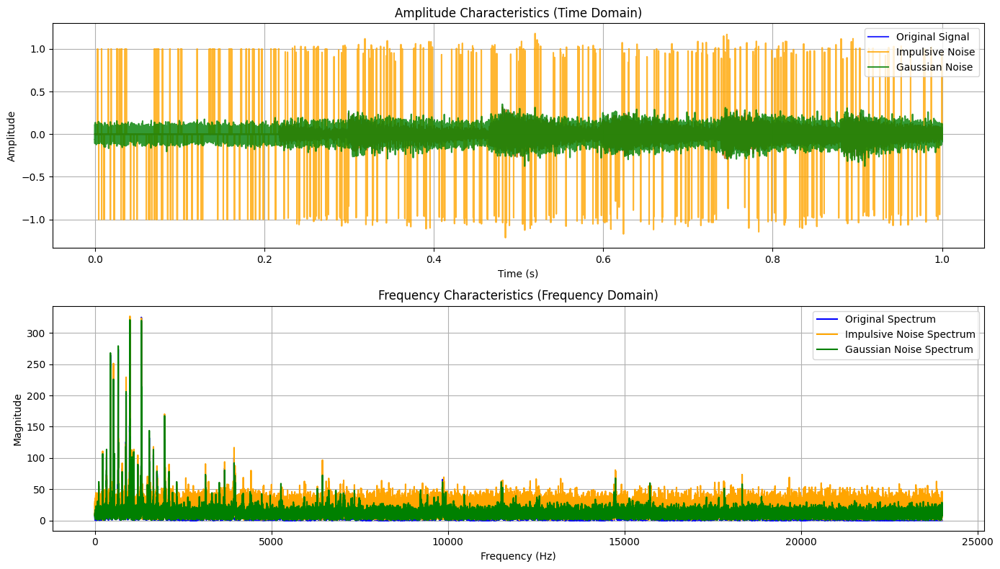

In [ ]:
# Compute DFT for each signal segment
original_dft = fft(signal)
impulsive_dft = fft(impulsive_noisy_audio)
gaussian_dft = fft(gaussian_noisy_audio)
freqs = fftfreq(len(signal), 1 / sample_rate)

# Focus on positive frequencies only
positive_freqs = freqs[:len(freqs) // 2]
original_magnitude = np.abs(original_dft[:len(freqs) // 2])
impulsive_magnitude = np.abs(impulsive_dft[:len(freqs) // 2])
gaussian_magnitude = np.abs(gaussian_dft[:len(freqs) // 2])

# Plot amplitude comparison in time domain
plt.figure(figsize=(14, 8))

# Original signal in time domain
plt.subplot(2, 1, 1)
plt.plot(time, signal, label="Original Signal", color="blue", alpha=0.8)
plt.plot(time, impulsive_noisy_audio, label="Impulsive Noise", color="orange", alpha=0.8)
plt.plot(time, gaussian_noisy_audio, label="Gaussian Noise", color="green", alpha=0.8)
plt.title("Amplitude Characteristics (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Plot frequency characteristics
plt.subplot(2, 1, 2)
plt.plot(positive_freqs, original_magnitude, label="Original Spectrum", color="blue")
plt.plot(positive_freqs, impulsive_magnitude, label="Impulsive Noise Spectrum", color="orange")
plt.plot(positive_freqs, gaussian_magnitude, label="Gaussian Noise Spectrum", color="green")
plt.title("Frequency Characteristics (Frequency Domain)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

**1. Original Signal:**

Time Domain:
* Smooth and consistent waveform with low amplitude variation.
No noise or distortion is present.

Frequency Domain:
* Clean spectrum with energy concentrated in specific frequency bands, corresponding to the dominant frequencies of the signal.

**2. Impulsive Noise:**
Time Domain:
* Characterized by sharp, high-amplitude spikes occurring at random intervals.
* Highly disruptive and non-continuous, making it visually prominent in the time domain.

Frequency Domain:
* Adds random, high-magnitude spikes across various frequencies.
* The noise is not localized to specific frequency bands, making it harder to filter in the frequency domain.

Filtering Suitability:
* Best handled with time-domain filters like:
Median filters or non-linear filters to suppress spikes.
Threshold-based clipping to smooth out high-amplitude values.

**3. Gaussian Noise:**
Time Domain:
* Appears as random, continuous amplitude variations superimposed on the original signal.
* Less visually disruptive than impulsive noise but still affects the overall signal quality.

Frequency Domain:
* Increases the spectral energy uniformly across all frequencies, resulting in a "raised" spectrum.
* Noise is spread evenly and lacks specific peaks.

Filtering Suitability:
Can be addressed with both time and frequency-domain filters:

* Time Domain: Moving average or smoothing filters to reduce noise without major signal distortion.

* Frequency Domain: Linear filters like low-pass or band-pass filters are highly effective.

3. **Filter the Noise in the Time Domain**:
   - Apply the following filters to reduce noise:
     - **Moving Average (MA) Filter**: Smooth the signal using a sliding window average.
     - **Median Filter**: Remove spikes and outliers by replacing each point with the median of its neighborhood.
     - **Gaussian Filter**: Smooth the signal using a Gaussian kernel.
   - Experiment with different filter parameters (e.g., window size, kernel width) and observe their effects.

   **Hints**:
   - Use `np.convolve` for the Moving Average and Gaussian filters.
   - Use `scipy.signal.medfilt` for the Median filter.
   - Compare the results for different filter sizes (e.g., kernel sizes of 3, 5, or 7).

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


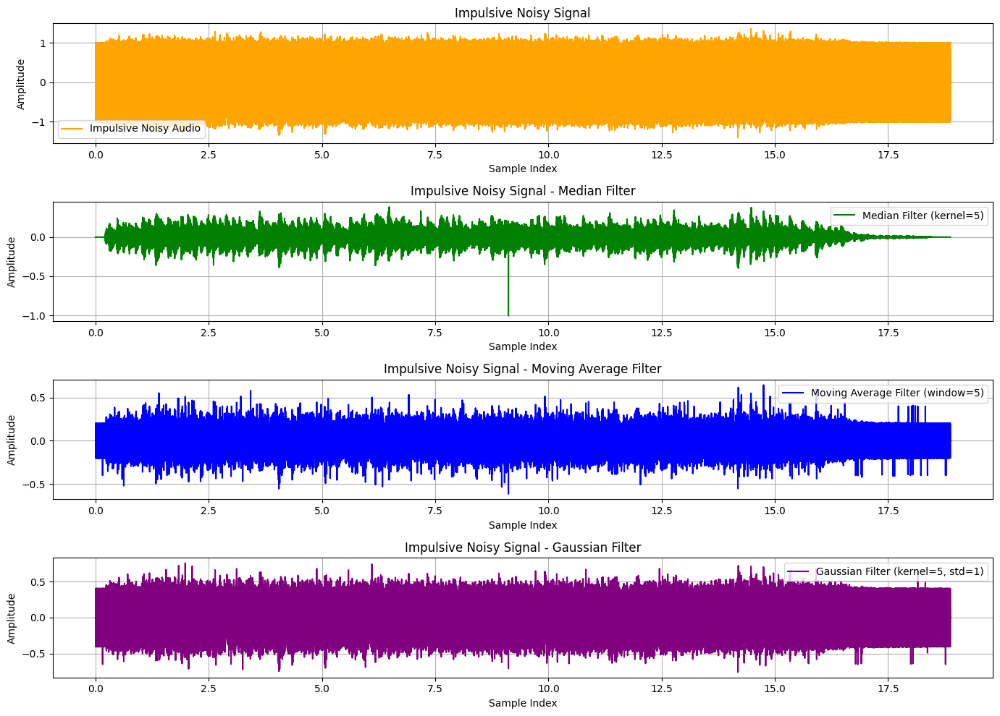

In [ ]:
# Moving Average Filter
def moving_average_filter(signal, window_size):
    kernel = np.ones(window_size) / window_size
    return np.convolve(signal, kernel, mode='same')

# Gaussian Filter Implementation
def gaussian_filter(signal, kernel_size, std_dev):
    kernel = gaussian(kernel_size, std=std_dev)
    kernel = kernel / np.sum(kernel)  # Normalize the kernel
    return np.convolve(signal, kernel, mode='same')

# Parameters for filters
window_sizes = [3, 5, 7]

# Apply Median Filter
filtered_impulsive_median = [medfilt(impulsive_noisy_audio, kernel_size=ws) for ws in window_sizes]
filtered_gaussian_median = [medfilt(gaussian_noisy_audio, kernel_size=ws) for ws in window_sizes]

# Apply Moving Average Filter
filtered_impulsive_ma = [moving_average_filter(impulsive_noisy_audio, ws) for ws in window_sizes]
filtered_gaussian_ma = [moving_average_filter(gaussian_noisy_audio, ws) for ws in window_sizes]

# Apply Gaussian Filter
filtered_impulsive_gaussian = [gaussian_filter(impulsive_noisy_audio, ws, 1) for ws in window_sizes]
filtered_gaussian_gaussian = [gaussian_filter(gaussian_noisy_audio, ws, 1) for ws in window_sizes]

# Plot results for impulsive noisy audio (for one window size)
plt.figure(figsize=(14, 10))

# Original impulsive noisy signal
plt.subplot(4, 1, 1)
plt.plot(time, impulsive_noisy_audio, label="Impulsive Noisy Audio", color="orange")
plt.title("Impulsive Noisy Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Median Filter result
plt.subplot(4, 1, 2)
plt.plot(time, filtered_impulsive_median[1], label="Median Filter (kernel=5)", color="green")
plt.title("Impulsive Noisy Signal - Median Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Moving Average Filter result
plt.subplot(4, 1, 3)
plt.plot(time, filtered_impulsive_ma[1], label="Moving Average Filter (window=5)", color="blue")
plt.title("Impulsive Noisy Signal - Moving Average Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Gaussian Filter result
plt.subplot(4, 1, 4)
plt.plot(time, filtered_impulsive_gaussian[1], label="Gaussian Filter (kernel=5, std=1)", color="purple")
plt.title("Impulsive Noisy Signal - Gaussian Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

**Median Filter:** Performs best for salt-and-pepper noise, effectively removing the spikes.

**Moving Average Filter:** Reduces the spikes but doesn't eliminate them completely.

**Gaussian Filter:** Smooths the signal but struggles to handle the abrupt, high-amplitude spikes.

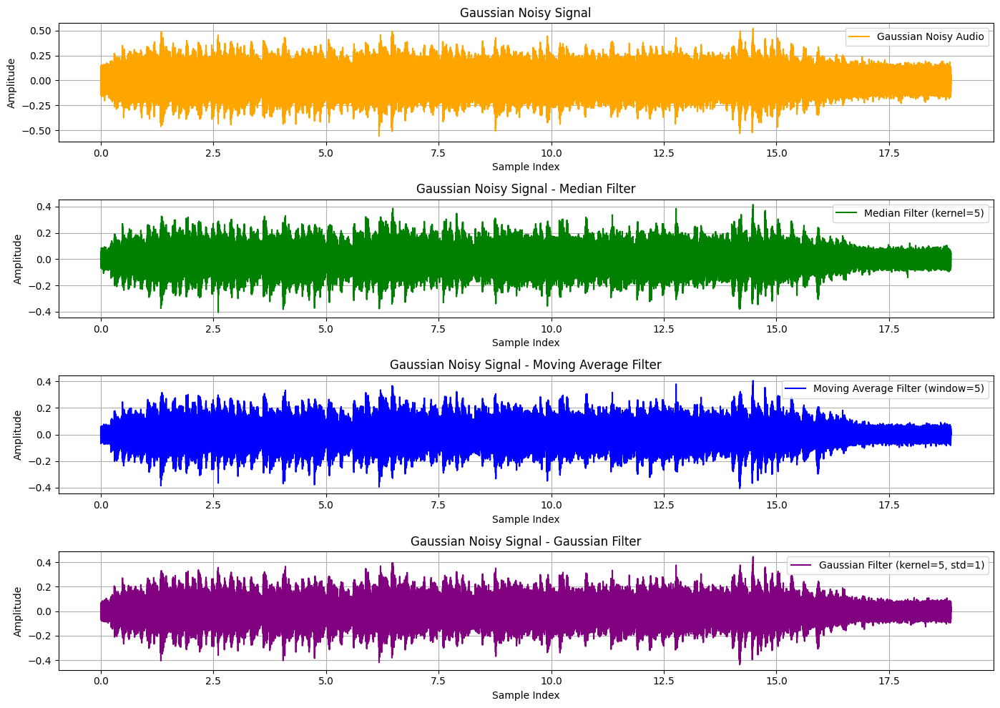

In [ ]:
# Plot results for Gaussian noisy audio (for one window size)
plt.figure(figsize=(14, 10))

# Original Gaussian noisy signal
plt.subplot(4, 1, 1)
plt.plot(time, gaussian_noisy_audio, label="Gaussian Noisy Audio", color="orange")
plt.title("Gaussian Noisy Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Median Filter result on Gaussian noise
plt.subplot(4, 1, 2)
plt.plot(time, filtered_gaussian_median[1], label="Median Filter (kernel=5)", color="green")
plt.title("Gaussian Noisy Signal - Median Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Moving Average Filter result on Gaussian noise
plt.subplot(4, 1, 3)
plt.plot(time, filtered_gaussian_ma[1], label="Moving Average Filter (window=5)", color="blue")
plt.title("Gaussian Noisy Signal - Moving Average Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Gaussian Filter result on Gaussian noise
plt.subplot(4, 1, 4)
plt.plot(time, filtered_gaussian_gaussian[1], label="Gaussian Filter (kernel=5, std=1)", color="purple")
plt.title("Gaussian Noisy Signal - Gaussian Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()



**Median Filter:**
Ineffective for Gaussian noise.
Removes outliers but does not smooth continuous noise effectively.

**Moving Average Filter:**
Moderately effective for Gaussian noise.
Reduces noise by averaging neighboring values but can blur transitions in the signal.

**Gaussian Filter:**
Most effective for Gaussian noise.
Smooths the noise while preserving the structure of the original signal.

4. **Compare Results**:
   - Plot the original, noisy, and filtered signals for each filter.
   - Evaluate the effectiveness of each filter in reducing "salt-and-pepper" and Gaussian noise.
   - Discuss the trade-offs between noise reduction and signal distortion for each filter.

   **Hints**:
   - Observe how each filter handles different noise types.
   - Evaluate signal preservation by comparing filtered signals to the original.

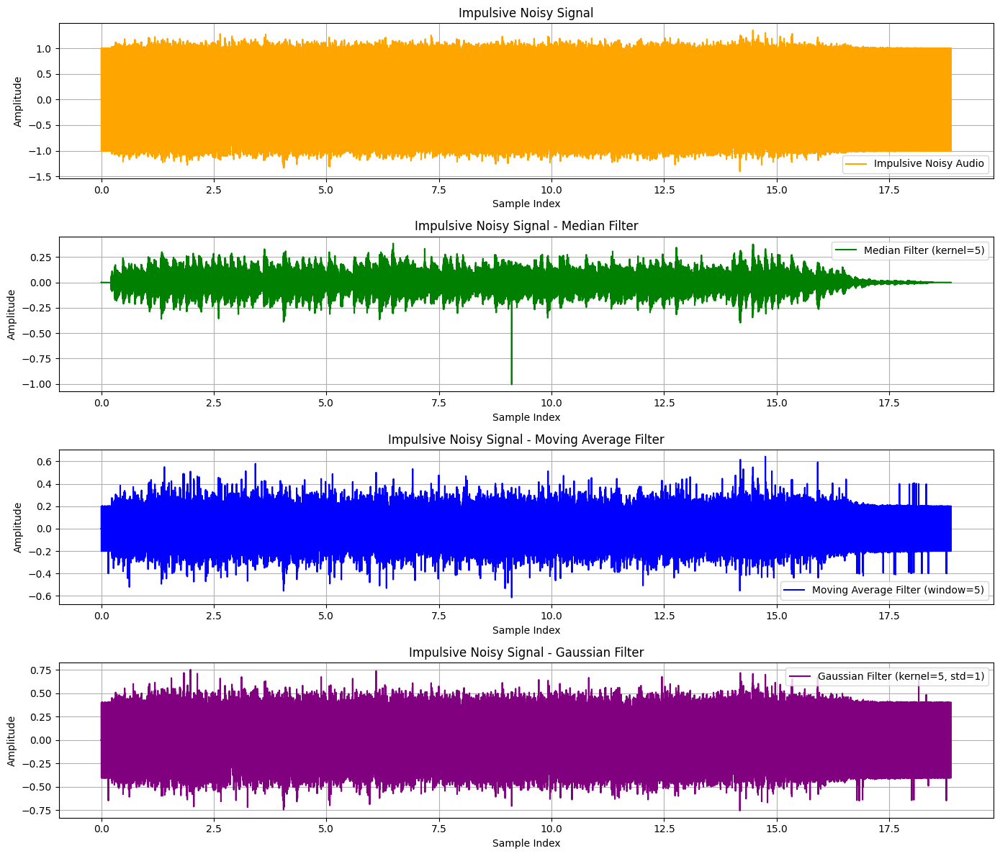

In [ ]:
# Plot comparison for salt-and-pepper noise
plt.figure(figsize=(14, 12))

# Original signal
plt.subplot(4, 1, 1)
plt.plot(time, impulsive_noisy_audio, label="Impulsive Noisy Audio", color="orange")
plt.title("Impulsive Noisy Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Median Filter result
plt.subplot(4, 1, 2)
plt.plot(time, filtered_impulsive_median[1], label="Median Filter (kernel=5)", color="green")
plt.title("Impulsive Noisy Signal - Median Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Moving Average Filter result
plt.subplot(4, 1, 3)
plt.plot(time, filtered_impulsive_ma[1], label="Moving Average Filter (window=5)", color="blue")
plt.title("Impulsive Noisy Signal - Moving Average Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Gaussian Filter result
plt.subplot(4, 1, 4)
plt.plot(time, filtered_impulsive_gaussian[1], label="Gaussian Filter (kernel=5, std=1)", color="purple")
plt.title("Impulsive Noisy Signal - Gaussian Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()


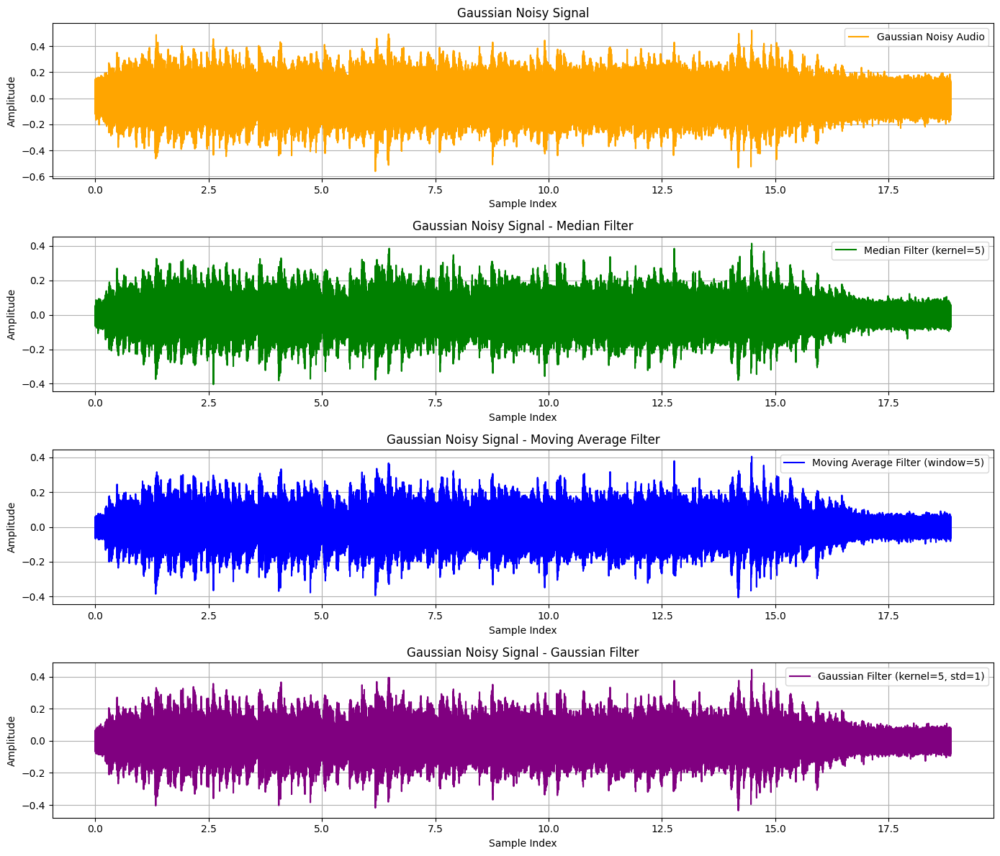

In [ ]:
# Plot comparison for Gaussian noise
plt.figure(figsize=(14, 12))

# Original Gaussian noisy signal
plt.subplot(4, 1, 1)
plt.plot(time, gaussian_noisy_audio, label="Gaussian Noisy Audio", color="orange")
plt.title("Gaussian Noisy Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Median Filter result on Gaussian noise
plt.subplot(4, 1, 2)
plt.plot(time, filtered_gaussian_median[1], label="Median Filter (kernel=5)", color="green")
plt.title("Gaussian Noisy Signal - Median Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Moving Average Filter result on Gaussian noise
plt.subplot(4, 1, 3)
plt.plot(time, filtered_gaussian_ma[1], label="Moving Average Filter (window=5)", color="blue")
plt.title("Gaussian Noisy Signal - Moving Average Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Gaussian Filter result on Gaussian noise
plt.subplot(4, 1, 4)
plt.plot(time, filtered_gaussian_gaussian[1], label="Gaussian Filter (kernel=5, std=1)", color="purple")
plt.title("Gaussian Noisy Signal - Gaussian Filter")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

## **Discussion of Results**
**1. Salt-and-Pepper Noise (Impulsive Noise)**

**Median Filter:**

Effectiveness: The most effective filter for removing impulsive noise (salt-and-pepper). It eliminates high-amplitude spikes while preserving the structure of the original signal.

Strengths: Reduces noise with minimal distortion of the underlying signal.

Limitations: Ineffective for other noise types, such as Gaussian noise.

**Moving Average Filter:**

Effectiveness: Moderately effective for impulsive noise. It reduces the magnitude of spikes but does not completely remove them.

Strengths: Provides some smoothing but not ideal for sharp, high-amplitude noise.

Limitations: Causes distortion by averaging spikes with surrounding values.

**Gaussian Filter:**

Effectiveness: Least effective for impulsive noise. The smoothness introduced by the filter does not address sharp, isolated spikes effectively.

Strengths: Preserves the general shape of the signal.

Limitations: Retains some spikes, making it unsuitable for impulsive noise removal.


**2. Gaussian Noise**

**Median Filter:**

Effectiveness: Ineffective for Gaussian noise. It is designed to remove outliers but struggles to handle continuous, low-amplitude noise variations.

Strengths: None for Gaussian noise.

Limitations: Does not smooth the noise effectively.

**Moving Average Filter:**

Effectiveness: Performs well for Gaussian noise, smoothing the low-amplitude variations effectively.

Strengths: Reduces noise and preserves the general structure of the signal.

Limitations: Can blur sharp transitions or details if the window size is too large.

**Gaussian Filter:**

Effectiveness: The best filter for Gaussian noise. It balances noise reduction with signal preservation, offering significant smoothing while maintaining signal details.

Strengths: Ideal for handling Gaussian noise due to its design.

Limitations: Less effective for impulsive noise or signals with sharp transitions.


## Part 3: Combined Noise Filtering

1. **Add Combined Noise**:
   - Introduce a combination of periodic (50 Hz, 120 Hz, 200 Hz) and impulsive/Gaussian noise to the audio signal.
   - Visualize the noisy signal in the time domain.

   **Hints**:
   - Combine the noise generation techniques from Parts 1 and 2.
   - Ensure the combined noise mimics real-world scenarios (e.g., electrical hum with random spikes).


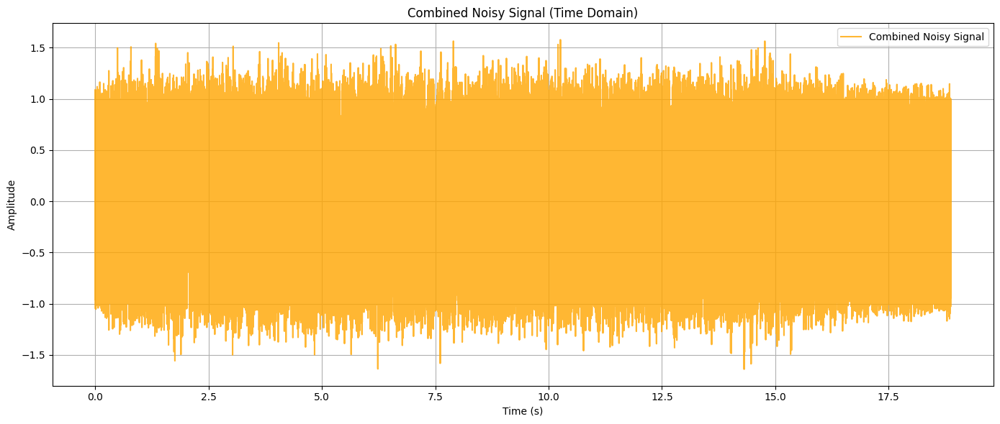

In [ ]:
# Generate periodic noise components
noise_50Hz = 0.03 * np.sin(2 * np.pi * 50 * time)
noise_120Hz = 0.03 * np.sin(2 * np.pi * 120 * time)
noise_200Hz = 0.03 * np.sin(2 * np.pi * 200 * time)
periodic_noise = noise_50Hz + noise_120Hz + noise_200Hz

# Add impulsive noise (salt-and-pepper noise)
impulsive_noisy_audio = signal.copy()
num_impulses = int(0.01 * len(signal))  # 1% of the total samples
impulse_indices = np.random.choice(len(signal), num_impulses, replace=False)
impulsive_noisy_audio[impulse_indices] += np.random.choice([-1, 1], size=num_impulses)  # Adding noise spikes with max or min amplitude to the signal

# Add Gaussian noise
std_dev = 0.05  # Standard deviation for Gaussian noise
gaussian_noise = np.random.normal(0, std_dev, len(signal))

# Combine all noises
combined_noise = periodic_noise + gaussian_noise + impulsive_noisy_audio
#- signal  # Subtract 'signal' to isolate combined noise
combined_noisy_signal = signal + combined_noise

# Visualize the combined noisy signal in the time domain
plt.figure(figsize=(14, 6))
plt.plot(time, combined_noisy_signal, label="Combined Noisy Signal", color="orange", alpha=0.8)
plt.title("Combined Noisy Signal (Time Domain)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()

2. **Apply Sequential Filtering**:
   - First, use frequency-domain techniques (e.g., DFT and band-stop filters) to remove periodic noise.
   - Then, apply time-domain filters (e.g., Moving Average, Median, Gaussian filters) to reduce impulsive/Gaussian noise.

   **Hints**:
   - Filter the periodic noise first to simplify the signal for time-domain filtering.
   - Experiment with the order and parameters of the filters.

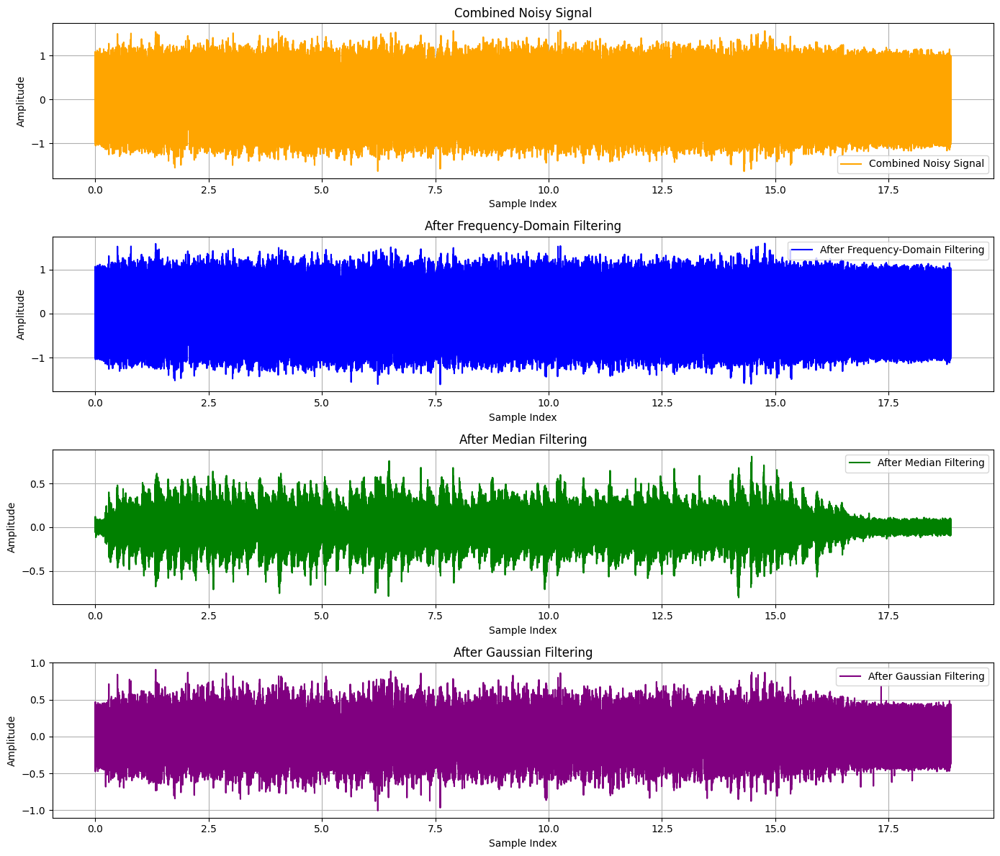

In [ ]:
# Step 1: Filter Periodic Noise (Frequency Domain)
# Compute the DFT of the combined noisy signal
dft_combined = fft(combined_noisy_signal)
freqs = fftfreq(len(combined_noisy_signal), 1 / sample_rate)

# Band-stop filter to remove periodic noise (50 Hz, 120 Hz, 200 Hz)
def band_stop_filter(freqs, center, width=5):
    mask = np.ones_like(freqs)
    mask[np.abs(freqs - center) < width] = 0
    mask[np.abs(freqs + center) < width] = 0  # Handle negative frequencies
    return mask

# Create the combined filter mask for periodic noise removal
filter_mask = band_stop_filter(freqs, 50) * band_stop_filter(freqs, 120) * band_stop_filter(freqs, 200)

# Apply the filter
filtered_dft = dft_combined * filter_mask
filtered_signal_frequency = np.real(ifft(filtered_dft))

# Step 2: Filter Impulsive and Gaussian Noise (Time Domain)
# Define the Moving Average filter
def moving_average_filter(signal, window_size):
    kernel = np.ones(window_size) / window_size
    return np.convolve(signal, kernel, mode='same')

# Define the Gaussian filter
def gaussian_filter(signal, kernel_size, std_dev):
    kernel = gaussian(kernel_size, std=std_dev)
    kernel = kernel / np.sum(kernel)  # Normalize the kernel
    return np.convolve(signal, kernel, mode='same')

# Median Filter
filtered_signal_median = medfilt(filtered_signal_frequency, kernel_size=5)

# Moving Average Filter
filtered_signal_ma = moving_average_filter(filtered_signal_frequency, window_size=5)

# Gaussian Filter
filtered_signal_gaussian = gaussian_filter(filtered_signal_frequency, kernel_size=5, std_dev=1)

# Plot the results
plt.figure(figsize=(14, 12))

# Original Combined Noisy Signal
plt.subplot(4, 1, 1)
plt.plot(time, combined_noisy_signal, label="Combined Noisy Signal", color="orange")
plt.title("Combined Noisy Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# After Frequency-Domain Filtering
plt.subplot(4, 1, 2)
plt.plot(time, filtered_signal_frequency, label="After Frequency-Domain Filtering", color="blue")
plt.title("After Frequency-Domain Filtering")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# After Median Filtering
plt.subplot(4, 1, 3)
plt.plot(time, filtered_signal_median, label="After Median Filtering", color="green")
plt.title("After Median Filtering")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# After Gaussian Filtering
plt.subplot(4, 1, 4)
plt.plot(time, filtered_signal_gaussian, label="After Gaussian Filtering", color="purple")
plt.title("After Gaussian Filtering")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

3. **Compare Results**:
   - Plot the original, noisy, and sequentially filtered signals.
   - Listen to the original, noisy, and sequentially filtered audio signals to evaluate the overall noise reduction.

   **Hints**:
   - Use `matplotlib` for comparison plots and `IPython.display.Audio` for audio playback.
   - Assess whether any residual noise remains after filtering.

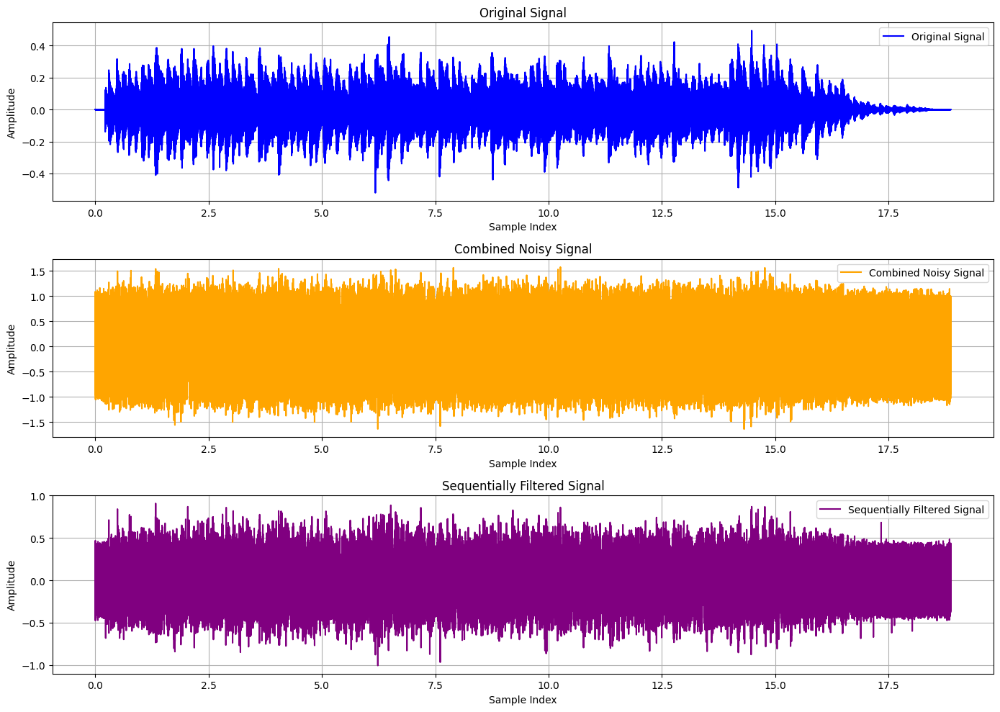

In [ ]:
# Plot the original, noisy, and sequentially filtered signals
plt.figure(figsize=(14, 10))

# Original Signal
plt.subplot(3, 1, 1)
plt.plot(time, signal, label="Original Signal", color="blue")
plt.title("Original Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Combined Noisy Signal
plt.subplot(3, 1, 2)
plt.plot(time, combined_noisy_signal, label="Combined Noisy Signal", color="orange")
plt.title("Combined Noisy Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

# Sequentially Filtered Signal (After Gaussian Filtering)
plt.subplot(3, 1, 3)
plt.plot(time, filtered_signal_gaussian, label="Sequentially Filtered Signal", color="purple")
plt.title("Sequentially Filtered Signal")
plt.xlabel("Sample Index")
plt.ylabel("Amplitude")
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

In [ ]:
# Audio Playback
print("Original Signal:")
display(Audio(signal, rate=sample_rate))

Original Signal:


In [ ]:
print("Combined Noisy Signal:")
display(Audio(combined_noisy_signal, rate=sample_rate))

Combined Noisy Signal:


In [ ]:
print("Sequentially Filtered Signal:")
display(Audio(filtered_signal_gaussian, rate=sample_rate))

Sequentially Filtered Signal:


4. **Analyze the Combined Approach**:
   - Discuss the effectiveness of combining frequency-domain and time-domain filtering techniques.
   - Highlight any trade-offs in noise reduction, signal distortion, or computational complexity.

   **Hints**:
   - Reflect on the strengths of each filtering technique.
   - Discuss how combining techniques improves overall performance.

## **Analysis of the Combined Approach:**

**1. Strengths of Frequency-Domain Filtering:**

Targets periodic noise (e.g., 50 Hz, 120 Hz, 200 Hz) with high precision.
Removes unwanted frequency components without impacting unrelated parts of the signal.
Leaves the overall structure of the signal intact.

**2. Strengths of Time-Domain Filtering:**

*   **Median Filter:** Effectively removes impulsive noise (salt-and-pepper), preserving edges and sharp transitions.
*   **Gaussian Filter:** Smooths Gaussian noise, reducing continuous low-amplitude variations while maintaining signal shape.
* Addresses noise that cannot be isolated in the frequency domain.


**3. Combined Approach:**

Sequential Filtering enhances noise reduction: <br>
* Frequency-domain filtering first eliminates periodic noise, simplifying the signal.
* Time-domain filtering then focuses on reducing impulsive and Gaussian noise, refining the signal further.

The combination effectively handles all noise types with minimal residual noise.

**1. Noise Reduction:**

The combined approach maximizes noise removal across all noise types.
Minor residual noise may remain if noise characteristics overlap (e.g., impulsive spikes overlapping periodic noise).

**2. Signal Distortion:**

Frequency-domain filtering introduces minimal distortion, as it only affects specific frequencies.
Time-domain filtering (e.g., Gaussian smoothing) can cause blurring or loss of sharp transitions, especially with larger filter kernels.
Sequential filtering minimizes distortion by applying each filter to the noise type it handles best.

**3. Computational Complexity:**

* **Frequency-Domain Filtering:**
Efficient for periodic noise removal, especially with fast algorithms like FFT.

* **Time-Domain Filtering:**
Median and Gaussian filtering are computationally more intensive, particularly for larger kernels.

* **Combined Approach:**
Increases computational cost due to sequential steps, but this is justified by the improved noise reduction and signal quality.

**How Combining Techniques Improves Overall Performance**
Each filter type compensates for the weaknesses of the other:
Frequency-domain filtering does not address impulsive or Gaussian noise, which is handled by time-domain filters.
Time-domain filters, while effective for impulsive and Gaussian noise, cannot target periodic noise embedded in the frequency spectrum.
Sequential filtering ensures targeted noise removal, preserving the integrity of the original signal.

**Conclusion:**
Combining frequency-domain and time-domain filtering techniques is highly effective for addressing mixed noise types.